<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Комментарий ревьюера</b>


Привет, Андрей! Давай знакомиться! Меня зовут Дмитрий Махортов, и я буду проверять твой проект. Сразу предлагаю общение на «ты» 🙂, но если тебе это не комфортно, то дай знать, и мы перейдем на «вы». 


Моя основная цель — не указать на совершенные тобою ошибки, а поделиться своим опытом и помочь тебе погрузиться в увлекательный мир работы с данными и вырасти в крепкого профи. Это отдаленная цель. А ближайшая - сделать твою работу еще лучше )).
   
    
Все ключевые этапы в работе выполнены, и я вижу что с проектом ты справшяешься. Есть моменты, которые нужно доработать, но я уверен, у тебя все получится.
        
Расскажу как обычно проходит проверка:    
Бывают моменты, которые требуют пристального внимания. Комментарии по ним выделены <span style='background-color:#F7B3A4'> красным цветом </span> и обозначены значком 🛑. После их доработки проект будет принят.  🙂
 
<span style='background-color:#B7EBA7'> Зеленым цветом </span> и значком ✅ отмечены удачные и элегантные решения, на которые можно опираться в будущих проектах. Или советы «со звездочкой», которые помогут тебе в будущем.

<span style='background-color:#F9EDA6'>Жёлтым цветом </span> и значком ⚠️ выделено то, что в следующий раз можно сделать по-другому. Ты можешь учесть эти комментарии при выполнении будущих заданий или доработать проект сейчас (однако это не обязательно).

Давай работать над проектом в диалоге: **если ты что-то меняешь в проекте по моим рекомендациям — пиши об этом**. Выбери для своих комментариев какой-то заметный цвет, так мне будет легче отследить изменения. Пожалуйста, **не перемещай, не изменяй и не удаляй мои комментарии**. Всё это поможет выполнить повторную проверку твоего проекта оперативнее. 
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>образец комментария студента</b></font>
   
Можешь использовать этот комментарий. Просто удали этот текст и вместо него напиши свой 🙂

</div>

# Поиск по изображениям

# Прекод

# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные лежат в папке `/datasets/image_search/` или доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 Да, это хорошая практика - дать описание контекста и проблемы, которую мы решаем. </div>

In [1]:
!pip install spacy -q
!spacy download en_core_web_sm -q

✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [2]:
!pip install -q catboost

In [3]:
import pandas as pd
import numpy as np


import re
import spacy
from transformers import BertTokenizer, BertModel

from sklearn.linear_model import LinearRegression
import catboost

from sklearn.preprocessing import  StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GroupShuffleSplit

import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torchvision.models as models
from torchvision import transforms
from tqdm.notebook import tqdm
import os


tqdm.pandas()

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, все нужные библиотеки импортированы в начале ноутбука.Это хорошая практика.</div>

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


Вынесу папку в константу, чтобы наставнику было легче проверять свой проект, если исходники у него будут лежать в другой папке.

In [4]:
UPLOAD_PATH = 'to_upload'

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Большое тебе человеческое спасибо за вынос пути к данным в отдельную константу. Это сэкономило мне немало времени при проверке.</div>

In [5]:
train_df = pd.read_csv(os.path.join(UPLOAD_PATH, 'train_dataset.csv'))
train_df.head(10)

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


Данные выглядят подозрительно. У первых 10 записей query_id и query_text совпадают. Посмотрим через метод sample на случайную выборку.

In [6]:
train_df.sample(10)

,image,query_id,query_text
2183,416106657_cab2a107a5.jpg,2206960564_325ed0c7ae.jpg#2,A white puppy is running on a tiled floor .
3874,2764178773_d63b502812.jpg,2890113532_ab2003d74e.jpg#2,Two dogs in motion in a grassy field with smal...
2336,3358682439_be4b83544c.jpg,1446053356_a924b4893f.jpg#2,Two girls in soccer strips are playing on a sp...
5663,3162045919_c2decbb69b.jpg,3251648670_9339943ba2.jpg#2,Two boys are walking inside a human-size exerc...
1581,2510020918_b2ca0fb2aa.jpg,1682079482_9a72fa57fa.jpg#2,A toddler girl in a swing is laughing .
615,2581066814_179d28f306.jpg,1174629344_a2e1a2bdbf.jpg#2,A group of people walking a city street in war...
5721,3565598162_56044bc2f7.jpg,2378149488_648e5deeac.jpg#2,Boy with a red crown in a shopping cart .
1412,3375549004_beee810e60.jpg,2933637854_984614e18b.jpg#2,"A man in an orange jersey with the letter "" 12..."
2846,2502905671_c6039804ab.jpg,3642220260_3aa8a52670.jpg#2,A black dog walks on the beach near the rocks .
3732,293327462_20dee0de56.jpg,2522297487_57edf117f7.jpg#2,a white woman in a green sweater holds a smili...


И все-таки query_id и query_text содержат разные данные.<br/>Посмотрим на пропуски.

In [7]:
train_df.info(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


Всего в обучающей выборке находится 5822 записи.<br/>
Пропусков не обнаружено.<br/>
Проверим на дубликаты.

In [8]:
train_df.duplicated().sum()

0

Явных дубликатов не обранужено.<br/>
Проверим сколько в обучающей выборке всего описанных изображений.

In [9]:
len(train_df['image'].unique())

1000

Т.е. на 1000 изображений мы имеем 5822 строк с описаниями.

Посмотрим на уникальность описаний

In [10]:
len(train_df['query_id'].unique())

977

Уникальных описаний меньше чем уникальных изображений. Из этого сложно сделать какие-то выводы, потому что каждое изображение содержит несколько описаний.

**Посмотрим на оценку экспертов**

In [11]:
expert_df = pd.read_csv(os.path.join(UPLOAD_PATH, 'ExpertAnnotations.tsv'), sep='\t', header=None,
                       names=['image', 'query_id', 'expert1', 'expert2', 'expert3'])
expert_df.head(10)

,image,query_id,expert1,expert2,expert3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,1,1,1
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2
8,106490881_5a2dd9b7bd.jpg,1425069308_488e5fcf9d.jpg#2,1,1,1
9,106490881_5a2dd9b7bd.jpg,1714316707_8bbaa2a2ba.jpg#2,2,2,2


Для одной картинки оцениваются несколько комментариев, что соответствует ожиданиям.

По ответам экспертов видно, что их оценки не всегда совпадают. Нам придется выбирать наиболее вероятный ответ, при этом еще нужно будет учитывать данные, полученные с помощью краудсорсинга. <br/>
Но сначала проанализируем данные.

Проверим на пропуски.

In [12]:
expert_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert1   5822 non-null   int64 
 3   expert2   5822 non-null   int64 
 4   expert3   5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


Записей столько же, сколько и в предыдущем датасете.<br/>
Пропуски не обнаружены. <br/>
Теперь проверим на дубликаты.

In [13]:
expert_df.duplicated(subset=['image', 'query_id']).sum()

0

Дубликаты не обнаружены. Проверим уникальность картинок.

Количество уникальных описаний в тренировочном датасете и в оценках экспертов совпадают.

Теперь проверим, описали ли эксперты каждую строку из тренировчного датасета, или в данных есть подвох.<br/>
Для этого получим идентификаторы из столбцов image + query_id<br/>
И проверим пересечение этих идентификаторов из двух датасетов.

In [14]:
ids_train = train_df.apply(lambda x: x['image'] + x['query_id'], axis=1)
len(ids_train)

5822

In [15]:
ids_expert = expert_df.apply(lambda x: x['image'] + x['query_id'], axis=1)
len(ids_expert)

5822

In [16]:
len(set(ids_train).intersection(set(ids_expert)))

5822

Эксперты оценили каждую строку тренировочного датасета.

Теперь посмотрим на данные с оценкой экспертов.

In [17]:
expert_df[['expert1', 'expert2', 'expert3']].describe()

,expert1,expert2,expert3
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000


Мы видим, что среднняя оценка у эксперта1 ниже, а у эксперта3 выше.<br/>
Причем у двух экспертом медианная оценка равна 1. Это значит, что больше чем у половины записей изображение и запрос совершенно не соответствуют друг другу.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

**Посмотрим на краудсорс**

In [18]:
crowd_df = pd.read_csv(os.path.join(UPLOAD_PATH, 'CrowdAnnotations.tsv'), sep='\t', header=None,
                      names=['image', 'query_id', 'confirmed_fraction', 'confirmed_count', 'refuted_count'])
crowd_df.head(10)

,image,query_id,confirmed_fraction,confirmed_count,refuted_count
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000000,0,3
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.000000,0,3
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,0.000000,0,3
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,0.333333,1,2
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,0.000000,0,3
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,0.000000,0,3


Для одной картинки оцениваются несколько комментариев, что соответствует ожиданиям.

In [19]:
crowd_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   image               47830 non-null  object 
 1   query_id            47830 non-null  object 
 2   confirmed_fraction  47830 non-null  float64
 3   confirmed_count     47830 non-null  int64  
 4   refuted_count       47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


Записей сильно больше, чем в предыдущих датасетах.<br/>
Проверим на дубликаты.

In [20]:
crowd_df.duplicated(subset=['image', 'query_id']).sum()

0

Явные дубликаты не обнаружены. Проверим уникальность картинок.

In [21]:
len(crowd_df['image'].unique())

1000

Уникальных картинок по прежнему 1 тысяча. Проверим те ли это картинки. 

In [22]:
len(set(train_df['image']).intersection(set(crowd_df['image'])))

1000

Картинки оцениваются из оригинального датасета.

Теперь проверим количество уникальных описаний.

In [23]:
len(crowd_df['query_id'].unique())

1000

Уникальных описаний больше. <br/>
Можно сделать вывод, что краудсорсинг позволяет получить гораздо больше данных, чем с использованием экспертов.

Посмотрим на данные через метод descibe. Но перед этим еще вычислим признак - общее количество оценивающих.

In [24]:
crowd_df['total_count'] = crowd_df.apply(lambda x: x['confirmed_count'] + x['refuted_count'], axis=1)
crowd_df[['confirmed_fraction', 'confirmed_count', 'refuted_count', 'total_count']].describe()

,confirmed_fraction,confirmed_count,refuted_count,total_count
count,47830.000000,47830.000000,47830.000000,47830.000000
mean,0.068786,0.208488,2.820155,3.028643
std,0.207532,0.628898,0.656676,0.208075
min,0.000000,0.000000,0.000000,3.000000
25%,0.000000,0.000000,3.000000,3.000000
50%,0.000000,0.000000,3.000000,3.000000
75%,0.000000,0.000000,3.000000,3.000000
max,1.000000,5.000000,6.000000,6.000000


Мы видим, что максимальное количество человек, которые оценивают изображение с описанием не может быть больше 6. В большинстве случаев оценивающих 3 человека, как и экспертов.<br/>
Причем больше, чем в 75% случаев люди отмечают, что описание не соответствует изображению.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

Прежде чем продолжим анализ входных данных, загрузим последний датасет - тестовый.

In [25]:
test_df = pd.read_csv(os.path.join(UPLOAD_PATH, 'test_queries.csv'), sep='|', index_col=[0])
test_df.head(10)

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg
5,1232148178_4f45cc3284.jpg#0,A baby girl playing at a park .,1232148178_4f45cc3284.jpg
6,1232148178_4f45cc3284.jpg#1,A closeup of a child on a playground with adul...,1232148178_4f45cc3284.jpg
7,1232148178_4f45cc3284.jpg#2,A young boy poses for a picture in front of a ...,1232148178_4f45cc3284.jpg
8,1232148178_4f45cc3284.jpg#3,A young girl is smiling in front of the camera...,1232148178_4f45cc3284.jpg
9,1232148178_4f45cc3284.jpg#4,There is a little blond hair girl with a green...,1232148178_4f45cc3284.jpg


Содержимое соответствует описанию в тексте задачи.  У одной картинки есть несколько описаний.<br/>
В итоге нужно будет найти картинку, максимально соответствующую описанию.

In [26]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


Всего 500 записей, пропуски не обнаружены. Проверим на дубликаты.

In [27]:
test_df.duplicated().sum()

0

Дубликаты не найдены.

**Резюме**<br/>
Проведен первичный обзор входных файлов:
- train_dataset.csv: информация для обучения
- CrowdAnnotations.tsv: разметка краудсорса
- ExpertAnnotations.tsv: разметка эксперов
- test_queries.csv: информация для тестирования

Ни в одном из файлов не обнаружены пропуски, дубликатов также нет.<br/>
Объем данных для обучения совпадает с объемом данных, размеченных экспертами.<br/>
Краудсорсинговый датасет - намного больше.<br/>
Но качество данных экспертов лучше: они могут классифицировать соответствие текста изображению по 4-х бальной шкале.<br/>
На краудсорсинговой платформе оценивают бинарным признаком: соответствует/не соответствует.<br/>
Причем мы считаем по умолчанию, что качество оценки эксперта выше, чем качество оценки сторонних людей.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, загружены первые датафреймы, проведено обстоятельное знакомство. Очень хорошо, что ты понимаешь качественную разницу между экспертными и крауд оценками. </div>

**Сагрегируем итоговую оценку**

Сначала выберем оценку, за которую проголосовало большее количество экспертов: 2 из 3

In [28]:
def fill_rating(x):
    value = None
    if x['expert1'] == x['expert2']:
        value = x['expert1']
    elif x['expert1'] == x['expert3']:
        value = x['expert1']
    elif x['expert2'] == x['expert3']:
        value = x['expert2']
    else: 
        return value
    
    #смасштабируем оценку 
    return (value - 1)/3
        
expert_df['rating'] = expert_df.apply(fill_rating, axis=1)
expert_df['rating'].isnull().sum()

126

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

Всего 126 раз из 5822 не удалось получить экспертную оценку голосованием. Посмотрим на примеры этих записей.

In [29]:
expert_df[expert_df['rating'].isnull()].head(10)

,image,query_id,expert1,expert2,expert3,rating
17,1082379191_ec1e53f996.jpg,1536774449_e16b1b6382.jpg#2,1,2,3,NaN
40,1119015538_e8e796281e.jpg,2534502836_7a75305655.jpg#2,2,3,4,NaN
47,1122944218_8eb3607403.jpg,3325497914_f9014d615b.jpg#2,2,3,4,NaN
168,1287475186_2dee85f1a5.jpg,2918769188_565dd48060.jpg#2,1,2,3,NaN
199,1329832826_432538d331.jpg,1536774449_e16b1b6382.jpg#2,1,2,3,NaN
262,136886677_6026c622eb.jpg,2877503811_4e311253ec.jpg#2,1,2,3,NaN
266,136886677_6026c622eb.jpg,354642192_3b7666a2dd.jpg#2,1,2,3,NaN
269,136886677_6026c622eb.jpg,801607443_f15956d1ce.jpg#2,1,2,3,NaN
287,1389264266_8170bc1c54.jpg,2666179615_f05a9d8331.jpg#2,1,2,3,NaN
401,1472230829_803818a383.jpg,354642192_3b7666a2dd.jpg#2,1,2,3,NaN


Объединим оценки экспертов с оценками краудсорса.

In [30]:
rating_df = pd.merge(expert_df, crowd_df, on=['image', 'query_id'], how='left')
rating_df.shape

(5822, 10)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">

По объединению экспертных и крауд оценок все ОК, но подсвечу возможные альтернативы
    
--------------    
    
    
В этом проекте есть несколько возможных стратегий работы с обучающими и краудсорс оценками,  вот эти стратегии с плюсами и минусами:
   

   - использовать соединение через outer, в этом случае, при корректной обработке пропусков мы можем получить более 50К размеченых пар. К плюсам данного подхода можно отнести большое количество данных. Минус - в основном это будут данные, размеченные краудсорсерами, а там качество раметки ниже.
   - использовать только экспертные оценки. плюс - высокое качество данных (разметка имеет шкалу). Минус - данных меньше.  Поясню по поводу качества разметки на примере: если на изображении одна собака, а в описании "две собаки бегут по берегу", то эксперты поставять соответствие 0,6-0,7 (переводя в шкалу 0-1), а краудсорсеры поставят 0.  Но на экспертных оценках модель хотя-бы научится находить собак, а на краудсор оценках ничему не начится.

   - использование соединения через left.  Данный подход очевидно проигрывает второму варианту: данных столько же, нужно дополнительно возиться с объединением, но качество разметки снижается.. Но это соответсвует предложениям авторов проекта, поэтому такой подход имеет право на жизнь

   - объединение через inner. Тут все плохо - и данных ОЧЕНЬ мало (в два раза меньше, чем использовать только экспертные оценки) и качество у них "подпорчено". И навыков по обработке пропусков не получаем.....


</div>

Данные объединились корректно.

In [31]:
rating_df[rating_df['rating'].isnull()].head(10)

,image,query_id,expert1,expert2,expert3,rating,confirmed_fraction,confirmed_count,refuted_count,total_count
17,1082379191_ec1e53f996.jpg,1536774449_e16b1b6382.jpg#2,1,2,3,NaN,0.000000,0.0,3.0,3.0
40,1119015538_e8e796281e.jpg,2534502836_7a75305655.jpg#2,2,3,4,NaN,0.333333,1.0,2.0,3.0
47,1122944218_8eb3607403.jpg,3325497914_f9014d615b.jpg#2,2,3,4,NaN,NaN,NaN,NaN,NaN
168,1287475186_2dee85f1a5.jpg,2918769188_565dd48060.jpg#2,1,2,3,NaN,0.000000,0.0,3.0,3.0
199,1329832826_432538d331.jpg,1536774449_e16b1b6382.jpg#2,1,2,3,NaN,0.000000,0.0,3.0,3.0
262,136886677_6026c622eb.jpg,2877503811_4e311253ec.jpg#2,1,2,3,NaN,NaN,NaN,NaN,NaN
266,136886677_6026c622eb.jpg,354642192_3b7666a2dd.jpg#2,1,2,3,NaN,NaN,NaN,NaN,NaN
269,136886677_6026c622eb.jpg,801607443_f15956d1ce.jpg#2,1,2,3,NaN,NaN,NaN,NaN,NaN
287,1389264266_8170bc1c54.jpg,2666179615_f05a9d8331.jpg#2,1,2,3,NaN,0.000000,0.0,3.0,3.0
401,1472230829_803818a383.jpg,354642192_3b7666a2dd.jpg#2,1,2,3,NaN,NaN,NaN,NaN,NaN


Не смотря на большое количество оценок краудсорса, некоторые комментарии к изображениям в обучающем датасете все равно пропущены.<br/>
Там где данные есть, предлагаю следующий алгоритм:
- 0 оценка краудсорса усиливает минимальную оценку эксперта
- 1 оценка краудсорса усиливает максимальную оценку эксперта
- иначе берем среднюю оценку эксперта

In [32]:
def fill_crowd_rating(x):
    #если значение уже было заполнено, то вернем его
    if x['rating'] >= 0:
        return x['rating']
    
    #иначе добавим к голосованию данные их краудсорса
    value = None
    ratings = [x['expert1'], x['expert2'], x['expert3']]
    ratings.sort()
    if x['confirmed_fraction'] == 0.0:
        value = ratings[0]
    elif x['confirmed_fraction'] == 1.0:
        value = ratings[2]
    elif 0.0 < x['confirmed_fraction'] < 1.0:
        value = ratings[1]
    else: 
        return value
    
    #смасштабируем оценку 
    return (value - 1)/3
        
rating_df['rating'] = rating_df.apply(fill_crowd_rating, axis=1)
rating_df['rating'].isnull().sum()

55

Для 55 записей нет ни оценки экспертов, ни оценки краудсорса.<br/>
Придется удалить эти записи после объединения датасетов.

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Мне кажется тут ты путаешь причину со следствием. Изначально в датафреймах с экспертными и круд оценками все записи были оценены. Поэтому после объединения также у получившейся записи (пары изображение + описание) должна быть хотя бы одна оценка (экспертов или крауда), или обе сразу.
    
Так откуда же взялись пропуски? А это пары, где эксперты не смогли договориться, т.е. экспертная оценка есть, но нет согласованной экспертной оценки, поэтому ты поставил None

</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
да, я перепутал. спасибо за комментарий.
</div>

In [33]:
rating_df = rating_df.drop(['expert1', 'expert2', 'expert3',
                            'confirmed_fraction', 'confirmed_count', 'refuted_count', 'total_count'], axis=1)
rating_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     5822 non-null   object 
 1   query_id  5822 non-null   object 
 2   rating    5767 non-null   float64
dtypes: float64(1), object(2)
memory usage: 181.9+ KB


In [34]:
train_df = pd.merge(train_df, rating_df, on=['image', 'query_id'], how='inner')
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   rating      5767 non-null   float64
dtypes: float64(1), object(3)
memory usage: 227.4+ KB


Удалим из обучающей выборки записи без оценки

In [35]:
train_df = train_df[train_df['rating'].notnull()]
train_df.shape

(5767, 4)

Лишние данные удалены. Теперь посмотрим на итоговые данные.

In [36]:
train_df.head(10)

,image,query_id,query_text,rating
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.333333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.333333
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Молодец, во первых очень понятно и обстоятельно, не забываешь давать подробные комментарии. И очень круто что показываешь результат своей работы (итоговый датафрейм) со всех сторон, как несколько строк, так и размерности (и info) </div>

В данном фрагменте мы видим, что у картинки 2549968784_39bfbe44f9.jpg эксперты считают, что описание совпадает с картинкой. При этом идентификатор в query_id совпадает по значению с идентификатором в image.<br/>
Можно предположить, что это описание и есть оригинальное для этой картинки. Также его пытаются применить к другим картинкам, и оно уже может перестать соответствовать содержанию.<br/>
Проверим гипотезу на более широком наборе данных.

In [37]:
preview_df = train_df[train_df['rating'] == 1.0].head(10)
preview_df

,image,query_id,query_text,rating
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0
16,2718495608_d8533e3ac5.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,1.0
74,1425069308_488e5fcf9d.jpg,1425069308_488e5fcf9d.jpg#2,A white dog jumps to catch a blue ball in a li...,1.0
86,2140182410_8e2a06fbda.jpg,2140182410_8e2a06fbda.jpg#2,The kid is on a float in the snow .,1.0
110,3119076670_64b5340530.jpg,3119076670_64b5340530.jpg#2,Snowboarder in the air performing a stunt .,1.0
117,2374652725_32f90fa15c.jpg,317488612_70ac35493b.jpg#2,A dog runs through the deep snow .,1.0
122,3197917064_e679a44b8e.jpg,317488612_70ac35493b.jpg#2,A dog runs through the deep snow .,1.0
129,384577800_fc325af410.jpg,317488612_70ac35493b.jpg#2,A dog runs through the deep snow .,1.0
149,2666205903_8d287669e1.jpg,1536774449_e16b1b6382.jpg#2,A crowd of people at an outdoor event,1.0
150,2735558076_0d7bbc18fc.jpg,1536774449_e16b1b6382.jpg#2,A crowd of people at an outdoor event,1.0


Мы видим, что у фотографий 2549968784_39bfbe44f9.jpg, 718495608_d8533e3ac5.jpg, 1425069308_488e5fcf9d.jpg, 140182410_8e2a06fbda.jpg и 3119076670_64b5340530.jpg идентификаторы картинки и описания совпадают. Видимо идентификатор действительно относится к оригинальному изображению.<br/>
а вот идентификатор описания 317488612_70ac35493b и 1536774449_e16b1b6382 скорей всего от другой картинки.<br/>
Нам нужно во первых добавить в preview_df изображение с идентификаторами 317488612_70ac35493b и 1536774449_e16b1b6382, чтобы проверить гипотезу, что оригинальное изображение с идентификатором совпадает. <br/>
А также проверить гипотезу, что описания от одних изображений могут подходить другим изображениям. Для этого посмотрим на картинки и рейтингом 1, с разными идентификаторами в preview_df.

In [38]:
dog_runs = pd.Series(data=['317488612_70ac35493b.jpg', 
                           '317488612_70ac35493b.jpg#2', 
                           'A dog runs through the deep snow .',
                           1.0])
crowd_people = pd.Series(data=['1536774449_e16b1b6382.jpg', 
                               '1536774449_e16b1b6382.jpg#2', 
                               'A crowd of people at an outdoor event',
                               1.0])

preview_df = pd.concat([preview_df,
                        dog_runs.set_axis(preview_df.columns).to_frame().T,
                        crowd_people.set_axis(preview_df.columns).to_frame().T])

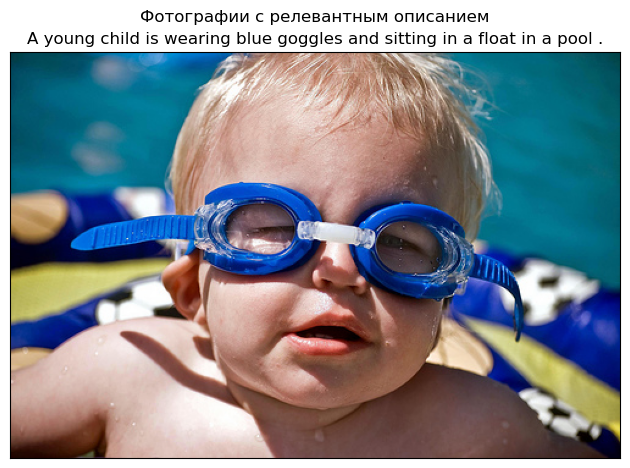

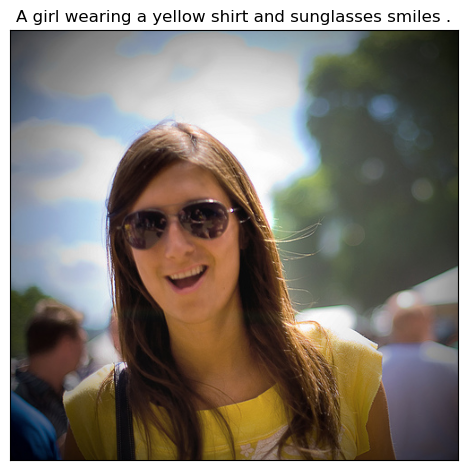

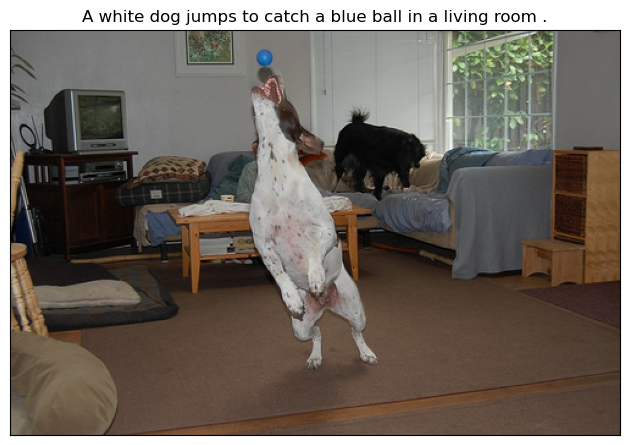

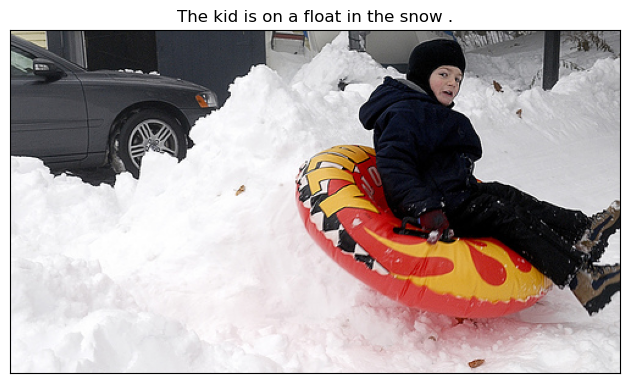

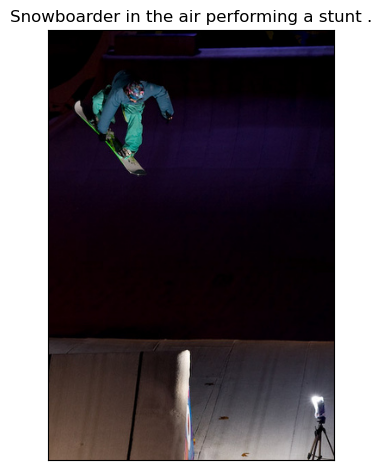

...

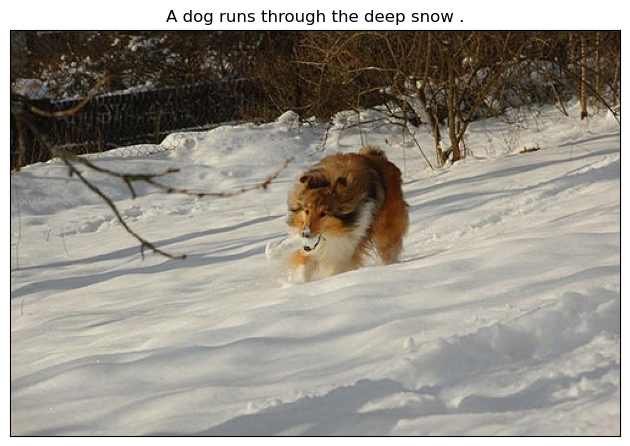

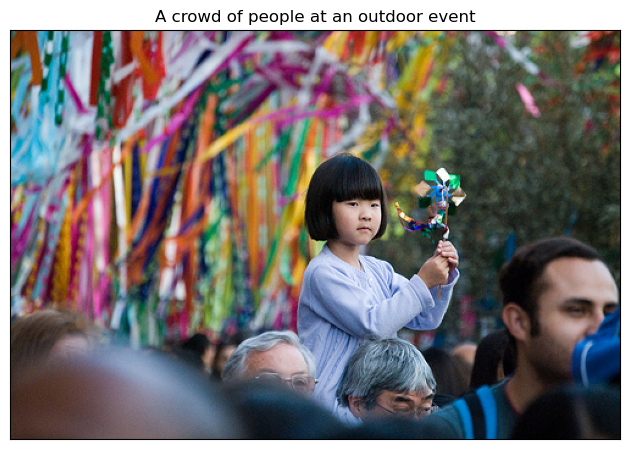

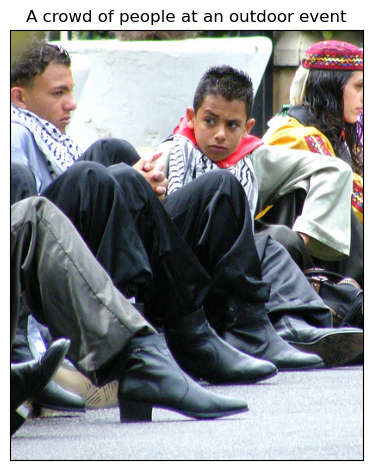

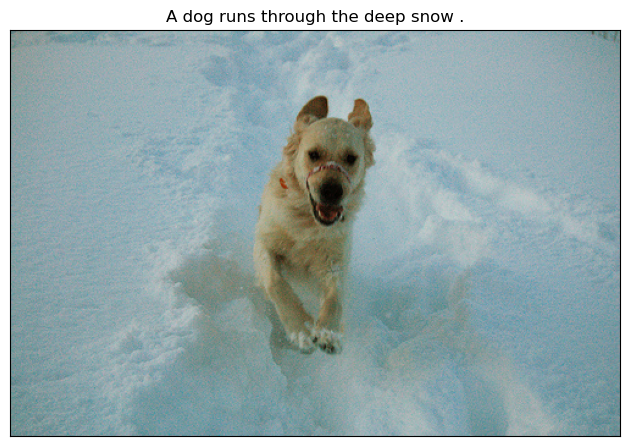

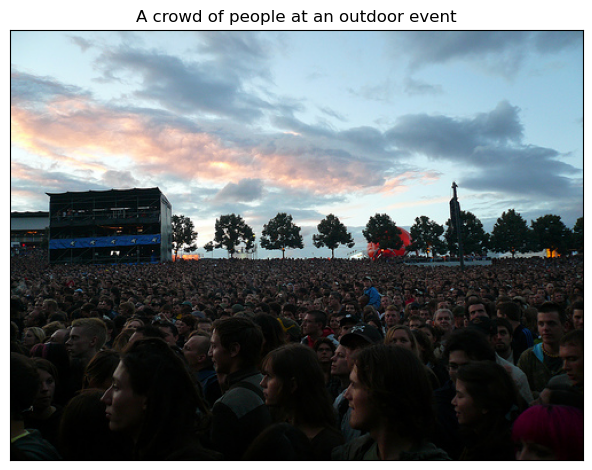

In [39]:
plt.suptitle('Фотографии c релевантным описанием')
for _, row in preview_df.iterrows():
    image_path = os.path.join(UPLOAD_PATH, 'train_images', row['image'])
    plt.imshow(Image.open(image_path))
    querty_text = row['query_text']
    plt.title(f'{querty_text}')
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    plt.show()

Мы видим, что действительно 2 последних изображения идеально подходят под описание.<br/>
А значит можно считать, что идентификатору описания существует подходящая пара с изображением.<br/>
Кроме того, мы убедились, что описания от одних изображений могут подходить и другим картинкам.

**Резюме**<br/>
Я провел первичный анализ данных.<br/>
В данных пропуски не обнаружены, дубликатов нет.<br/>
Оценки экспертов есть у каждой записи тренировочного датасета.<br/>
А вот у 55 записей нет краудсорсинговой оценки, не смотря на то что общее количетсво краудсорсинговых оценок на порядок больше.<br/>
Для обучения моделей я вычислил итоговую оценку соответствия картинки и текста путем голосования большинства экспертов (2 из 3).<br/>
Там где выбрать оценку путем голосования не удалось - я подключил к голосованию краудсорсинговую оценку: она усиливала голос того эксперта, к которому была ближе.<br/>
Также я установил, что идентификатор комментария соответствует идентификатору изображения.<br/>
Этот факт поможет мне на следующем этапе исключить из анализа фотографии с детьми.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Очень интересное и очень подробное исследование.  Ну и с предобработкой тоже все ОК.


Хотя можно улучшить качество данных, если проигнорировать крауд оценки (наразмер выборки это не повлияет,  однако оценки будут качетвеннее)
</div>

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Т.к. мы убедились в том, что для описания по его идентификатору можно найти соответствующее ему изображение.<br/>
То нам нужно просто найти все описания со стоп словами, и удалить из обучающей выборки изображения с соответствющими идентификаторами.<br/>
Воспользуемся словарем синонимов https://www.thesaurus.com/browse/child

In [40]:
stop_words = ['child', 'baby', 'boy', 'daughter', 'girl', 'juvenile', 'kid', 'minor', 'offspring', 'son',
              'youngster', 'youth', 'babe', 'bairn', 'bambino', 'brat', 'chick', 'cub', 'imp',
              'innocent', 'lamb', 'moppet', 'nestling', 'nipper', 'shaver', 'sprout', 'squirt',
              'stripling', 'suckling', 'tadpole', 'tot', 'tyke', 'tyke', 'urchin']

# оформим функцию, чтобы переиспользовать ее при тестировании модели.
def check_kids(text):
    for word in stop_words:
        if word in text.split():
            return True
    return False

Для проверки на стоп-слова, нужно лемматизировать текст. Подготовим текст для предстоящей векторизации тогда прямо в этом блоке. Выберем библиотеку spaCy, т.к. ее рекомендуют в статье
https://webdevblog.ru/podhody-lemmatizacii-s-primerami-v-python/
"на данный момент считается стандартом в индустрии NLP"

In [41]:
# удалим лишние пробелы и переносы строк.
train_df['query_text'] = train_df['query_text'].apply(lambda x: " ".join(x.split()))
train_df['query_text'].sample(20, random_state=42)

3290       A solitary climber on snowy , high mountains .
4618    A white dog in the snow running with an object...
2232    A profile of a young person with a punk hairst...
3254    a black dog is approaching a golden dog on peb...
4694                 A man in shorts climbs a rock face .
1107    A gray dog sits on a lawn wearing a bright blu...
2392                         Two people on a motorcycle .
5062                        People ride up an escalator .
2648               Two small dogs run through the grass .
3564                            Tourists examine a sign .
2484            a brown and black dog swimming in a river
4558    A musician and a crowd next to stage full of m...
4670          Two girls with dark hair and white shirts .
1508    A grey dog walks on top of a fallen tree in th...
133      A dog wearing a collar jumping from a platform .
1730                  A man scales a rock in the forest .
1851    A spotted dog rolling over on a pad placed on ...
535           

Лемматизируем текст и уберем из него стоп-слова.


In [42]:
disabled_pipes = [ "parser",  "ner"]
nlp = spacy.load("en_core_web_sm", disable=disabled_pipes)
def lemmatize(text):
    # приведем к нижнему регистру и уберем лишние пробелы
    text = " ".join(text.lower().split())
    doc = nlp(text)
    filtered_lemmas = \
        [token.lemma_ for token in doc \
         if token.is_alpha and not token.is_stop and not token.like_num]
    return ' '.join(filtered_lemmas)

train_df['text_lemm'] = train_df['query_text'].progress_apply(lemmatize)
train_df['text_lemm'].sample(20, random_state=42)

  0%|          | 0/5767 [00:00<?, ?it/s]

3290                 solitary climber snowy high mountain
4618                      white dog snow run object mouth
2232    profile young person punk hairstyle pierce ear...
3254           black dog approach golden dog pebbly beach
4694                            man short climb rock face
1107    gray dog sit lawn wear bright blue long sleeve...
2392                                    people motorcycle
5062                                people ride escalator
2648                                  small dog run grass
3564                                 tourist examine sign
2484                           brown black dog swim river
4558              musician crowd stage musical instrument
4670                           girl dark hair white shirt
1508                         grey dog walk fall tree wood
133                         dog wear collar jump platform
1730                                man scale rock forest
1851                        spot dog roll pad place porch
535           

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Идея с лемматизацией хороша. Но она очень "дорогая" - хорошая лемматизация занимает время. Кроме того ведь её нужно написать, проверить на ошибки, возможно "утащить в прод"..
    
А между тем лемматизация  нужна нам в двух случаях:  

 - При чистке датасета от детских изображений. 
 - При векторизации.
    
При поиске детских изображений я  считаю возможным упростить себе жизнь - взять возможные словоформы "запрещенных" слов. Как правиль их всего две - единственное и множественное число. 
    
А для вкторизациии делать лемматизацию в нашем случае не нужно. Модель BERT обучалась на обычных, сырых,не лемматизированных текстах.    

    
</div>

Сразу лемматизируем текст в тестовой выборке.

In [43]:
#test_df['query_text'] = test_df['query_text'].apply(lambda x: " ".join(x.split()))
test_df['text_lemm'] = test_df['query_text'].progress_apply(lemmatize)
test_df['text_lemm'].sample(20, random_state=42)

  0%|          | 0/500 [00:00<?, ?it/s]

361                    group girl gothically dress stand
73       woman girl ride downhill sled dog run alongside
374                                              dog run
155                      group people ice skate big city
104               little kid blue coat hat ride tricycle
394                           black dog fight orange toy
377                      dog jump tennis ball near ocean
124                                 boy fly distant kite
68                             kid play ultimate frisbee
450                          girl purple shirt feed duck
9      little blond hair girl green sweatshirt red sh...
194                 brown german shepherd dog play stick
406                              little girl blow candle
84            little boy smile cross rope assault course
371                        little white dog run sidewalk
388                                people sit park bench
495                             black dog dumbbell mouth
30                             

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
А вот тестовые запросы я бы не стал сейчас лемматизировать. Я писал тебе, что для BERT лемматизация не  нужна.  И даже если бы она была нужна, лучше всю обработку текста делать "на лету", это позволит работать с любым текстовым запросом.
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
я как раз не стал их леммазитировать. сначала сделал у себя локально, но у меня оценка упала.<br/>
понял, что bert это делает лучше меня.<br/>
Оставил только удаление побелов. Сейчас закомментировал, потому что оно ни на что не влияет.
</div>

Теперь посмотрим на изображения, описание которых содержит стоп-слова.

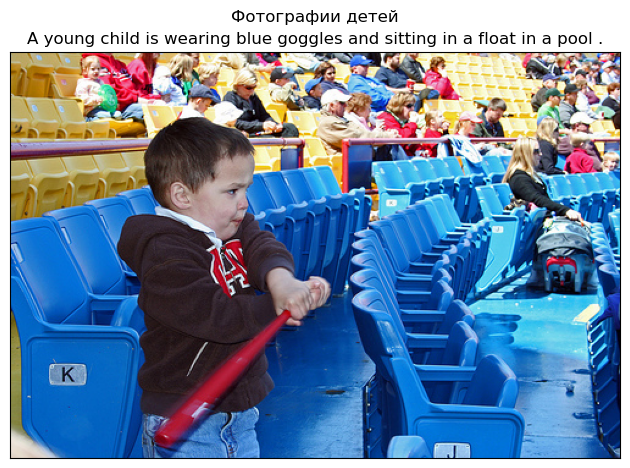

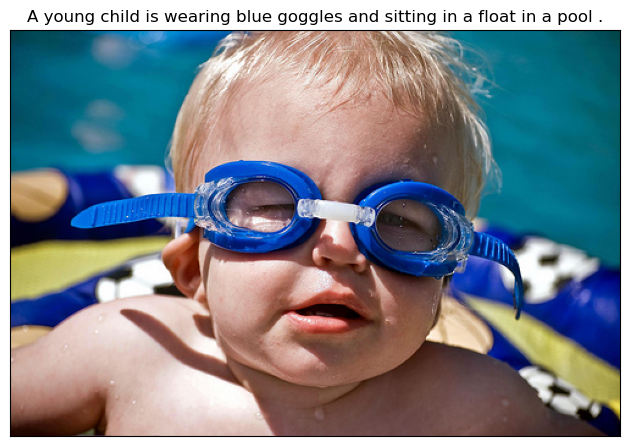

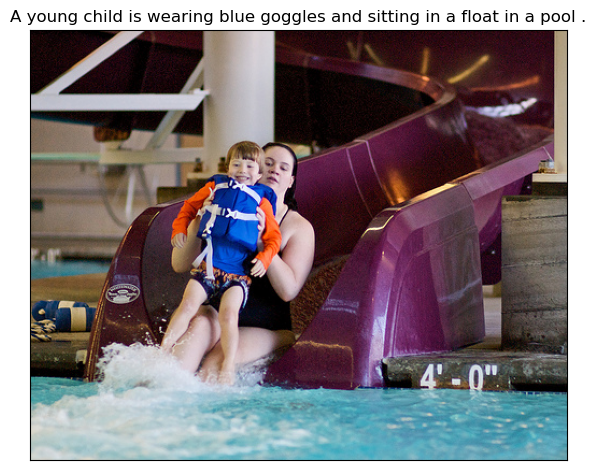

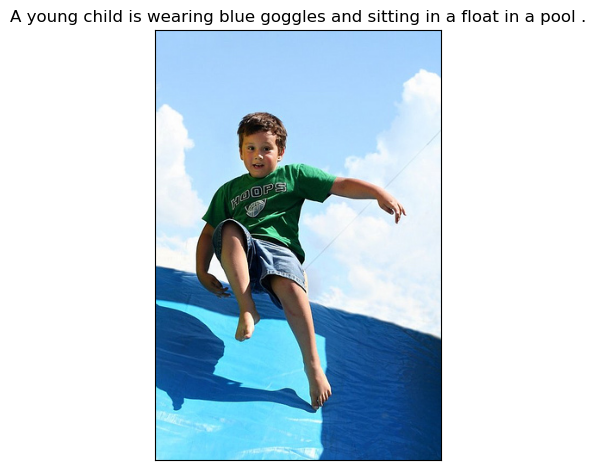

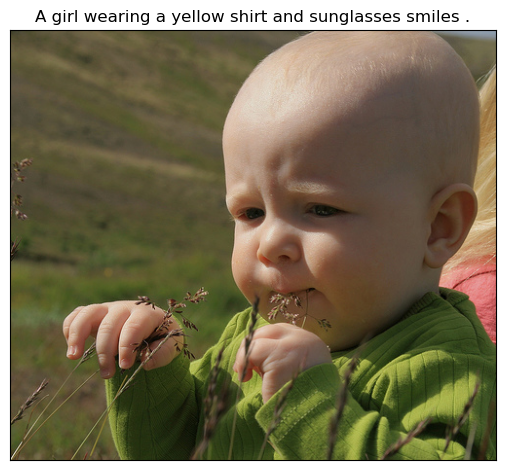

...

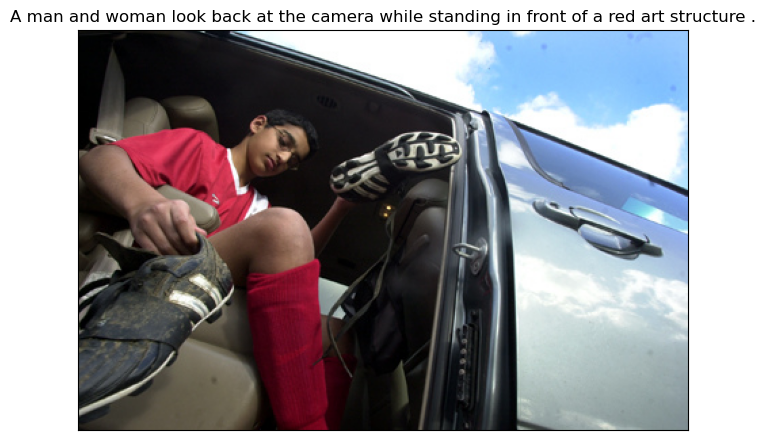

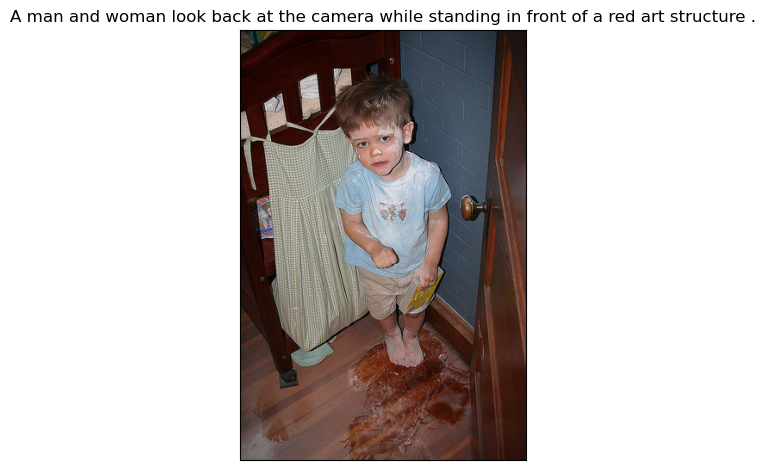

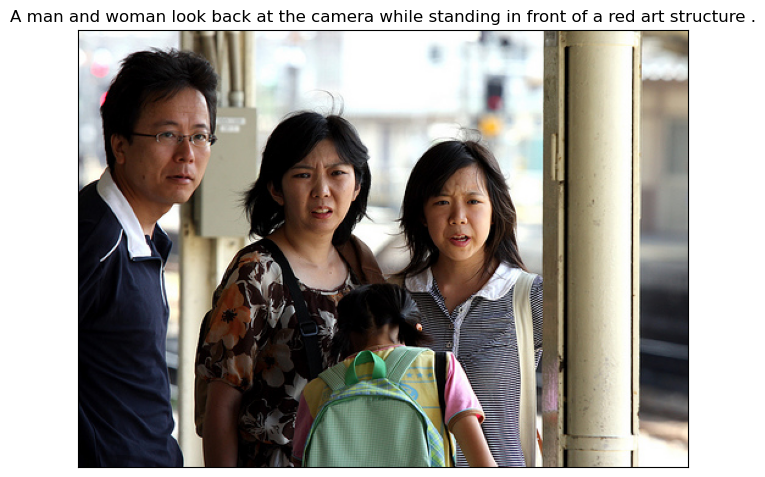

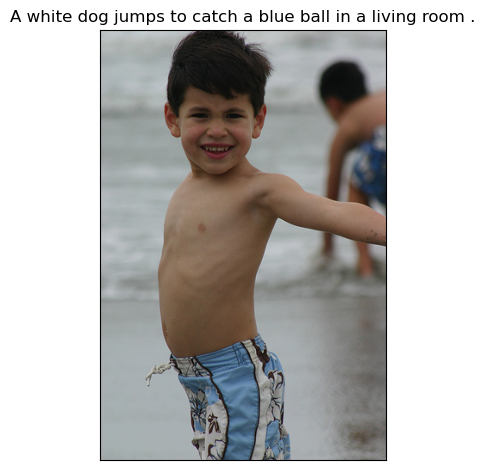

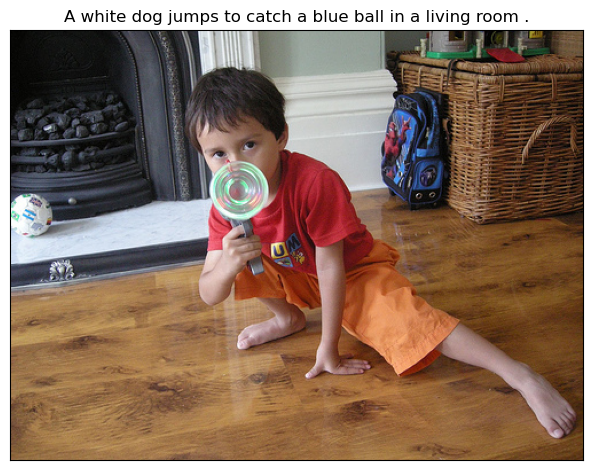

In [44]:
child_ids = set()
for _, row in train_df.iterrows():
    if(check_kids(row['text_lemm'])):
        child_ids.add(row['query_id'][:-2])


preview_df = train_df[train_df['image'].isin(child_ids)].head(20)
plt.suptitle('Фотографии детей')
for _, row in preview_df.iterrows():
    image_path = os.path.join(UPLOAD_PATH, 'train_images', row['image'])
    plt.imshow(Image.open(image_path))
    querty_text = row['query_text']
    plt.title(f'{querty_text}')
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    plt.show()

Фотографии детей удалось обнаружить с высокой точностью.<br/>
В предпросмотре у меня под сомнением только изображение с подписью "A girl wearing a yellow shirt and sunglasses s...". Но в описании содержится слово "girl", в переводе значит девочка. Даже если это совершеннолетняя девушка, оставим для безопасности это стоп-слово.<br/>
Удалим изображения с детьми.

In [45]:
train_df = train_df[~train_df['image'].isin(child_ids)].reset_index(drop=True)
train_df.shape

(4071, 5)

**Резюме**<br/>
Я проверил исходные данные на ограничения.<br/>
Для того, чтобы найти запрещенные слова - мне пришлось лемматизировать текст.
Также я обработал сразу текст тестовой выборки, чтобы в дальнейшем корректно обрабатывать запросы на поиск.<br/>
В итоге удалилось 1696 изображений из нашего датасета. Это почти 30% обучающей выборки.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 Из датасета исключены записи, содержащие изображения с детьми.  Выбран самый оптимальный и красивый способ найти эти изображения. </div>

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

Возьмем как и рекомендуется ResNet-18

In [46]:
resnet = models.resnet18(pretrained=True)

/Users/andrey/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/andrey/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Обучать модель не потребуется. Заморозим все веса.

In [47]:
for param in resnet.parameters():
    param.requires_grad_(False) 

Исключим последний <s>сверточный</s> полносвязный слой для классификации

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Последний слой в модели как раз полносвязный, для классификации ))

</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
косяк, поправил

</div>

In [48]:
modules = list(resnet.children())[:-1]
resnet = nn.Sequential(*modules) 

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

Переведем модель в режим предсказания

In [49]:
resnet.eval() 

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

Приведем изображение в нужный формат

In [50]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    norm,
]) 

In [51]:
def vectorize_image(name, path):
    image = Image.open(os.path.join(path, name)).convert('RGB')
    image_tensor = preprocess(image)
    image_tensor = image_tensor.unsqueeze(0)
    return pd.Series(resnet(image_tensor).flatten())

def transform_images(column, path):
    return column.progress_apply(lambda x: vectorize_image(x, path))    

In [52]:
image_features = transform_images(train_df['image'], os.path.join(UPLOAD_PATH, 'train_images'))
image_features.shape

  0%|          | 0/4071 [00:00<?, ?it/s]

(4071, 512)

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">

    
У тебя 1000 уникальных изображений (изначально было 1000, но треть ушла при чистке). При этом ты векторизуешь больше 4 тысяч изображений. Значит некоторые изображения векторизуются по нескольку раз. Учитыая что ты написал отдельную функцию для векторизации изображения можно ускорить её работу используя кэширование. Попробуй загуглить @lru_cache, это декоратор для кэширования, входящий в стадартную библиотеку python
    
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Если бы не дедлайн, я бы это успел сделать. Я так понял, что на оценку не влияет и для POC достаточно пока и так, потому что данных мало.

</div>

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 Отлично, вектра для изображений получены👍 </div>

Также обработаем изображения тестовой выборки.

In [53]:
test_image_features = transform_images(test_df['image'], os.path.join(UPLOAD_PATH, 'test_images'))
test_image_features.shape

  0%|          | 0/500 [00:00<?, ?it/s]

(500, 512)

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Мне кажется здесь ты немного перестарался. У нас всего 100 уникальных тестовых изображений. Зачем же векторизовать 500 (а значит каждое изображение векторизуется 5 раз).
    
К тому же лишние эмбеддинги нужно где-то хранить. Ладно сейчас мы "играем"  и данных мало. А если бы мы были гуглом?    
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
тут то же самое

</div>

**Резюме**<br/>
Я применил модель resnet18 и в итоге получил набор векторов размером 512.

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


Я выбрал модель Bert, потому что она дает лучшие результаты.<br/>
Не смотря на то, что я лемматизировал текст для поиска стоп-слов.<br/>
В токенизатор я буду передавать оригинальный текст, т.к. Bert его обрабатывает самостоятельно
и скорей всего делает это более эффективно, чем я.

In [54]:
bert_model = BertModel.from_pretrained('bert-base-uncased',
                                       output_hidden_states=True)
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [55]:
def transform_text(column):
    tokenized = column.apply(lambda x: tokenizer.encode(x, add_special_tokens=True))

    max_len = 0
    for i in tokenized.values:
        if len(i) > max_len:
            max_len = len(i)

    padded = np.array([i + [0]*(max_len - len(i)) for i in tokenized.values])
    attention_mask = np.where(padded != 0, 1, 0)
    
    batch_size = 100
    embeddings = []
    batch_count = padded.shape[0] // batch_size + 1
    for i in tqdm(range(batch_count), disable=batch_count==1):
        batch = torch.LongTensor(padded[batch_size*i:batch_size*(i+1)]) 
        attention_mask_batch = torch.LongTensor(attention_mask[batch_size*i:batch_size*(i+1)])
        with torch.no_grad():
            batch_embeddings = bert_model(batch, attention_mask=attention_mask_batch)
        
        embeddings.append(batch_embeddings[0][:,0,:].numpy())
    return np.concatenate(embeddings)

In [56]:
text_features = transform_text(train_df['query_text'])
text_features.shape

  0%|          | 0/41 [00:00<?, ?it/s]

(4071, 768)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично,полученные векторные представления для текстов описаний с помощью BERT </div>

Также векторизируем текст тестовой выборки

In [57]:
#test_text_features = transform_text(test_df['query_text'])

In [58]:
#test_text_features.shape

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
А вот тестовые описания векторизовать заранее не стоит. Для поиска изображений по описанию векторизацию описаний  нужно будет зашить в функцию поиска.
    
    
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
Перенес

</div>

**Резюме**<br/>
Я применил модель Bert и в итоге получил набор векторов размером 768.

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [59]:
features = np.concatenate((image_features, text_features), axis=1)
features.shape

(4071, 1280)

In [60]:
target = train_df['rating']
target.shape

(4071,)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 Вектора, полученные из текста и изображения объеденены👍 </div>

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

In [61]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, valid_indices = next(gss.split(X=features, y=target, groups=train_df['image']))
features_train = features[train_indices]
features_valid = features[valid_indices]
target_train = target[train_indices]
target_valid = target[valid_indices]
features_train.shape

(2818, 1280)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, благодаря использованию GroupShuffleSplit ты исключаешь попадание одного изображения в обучающий и валидационный наборы.</div>

In [62]:
features_valid.shape

(1253, 1280)

In [63]:
target_train.shape

(2818,)

In [64]:
target_valid.shape

(1253,)

Так как признаки мы получили из разных моделей - то нужно их смасштабировать.

In [65]:
scaler = StandardScaler()
features_train = scaler.fit_transform(features_train)
features_valid = scaler.transform(features_valid)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍

ОК, но я бы оставил для кэтбуста нескалированые данные.
    
Деревьям безразличен масштаб признаков, зато на инференсе избавимся от лишней операции.    
</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Мы решаем новую задачу и не знаем, наксколько хороши наши метрики и наши модели. Поэтому советую начать с бейзлайна - константной модели (можешь взять простой DummyRegressor).</div>

Теперь обучим модель линейной регрессии.<br/>
В качестве метрики качества выберем RMSE - она покажет меру отклонения от целевой оценки в тех же единицах измерения, что и оригинальная величина.

In [66]:
lr_model = LinearRegression()
lr_model.fit(features_train, target_train)
prediction = lr_model.predict(features_valid)
rmse = mean_squared_error(target_valid, prediction) ** 0.5
rmse

329.7258635326344

Получили слишком большую ошибку. Похоже модель переобучилась.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Да, похоже мы сталкиваемся с мультиколлинеарностью. Спасение - регуляризация. </div>

Обучим модель catboost

In [67]:
train_pool = catboost.Pool(features_train, target_train)
val_pool = catboost.Pool(features_valid, target_valid)
cb_model = catboost.CatBoostRegressor(eval_metric='RMSE', verbose=100, random_seed=42)
cb_model.fit(train_pool, eval_set=val_pool, early_stopping_rounds=150)

Learning rate set to 0.059915
0:	learn: 0.2959367	test: 0.3037926	best: 0.3037926 (0)	total: 107ms	remaining: 1m 46s
100:	learn: 0.2212991	test: 0.2730424	best: 0.2730424 (100)	total: 4.11s	remaining: 36.6s
200:	learn: 0.1762211	test: 0.2670973	best: 0.2670239 (198)	total: 8.05s	remaining: 32s
300:	learn: 0.1400727	test: 0.2634851	best: 0.2634815 (299)	total: 12.1s	remaining: 28.1s
400:	learn: 0.1140941	test: 0.2622623	best: 0.2621894 (399)	total: 16.1s	remaining: 24s
500:	learn: 0.0940178	test: 0.2614587	best: 0.2614195 (496)	total: 20.1s	remaining: 20.1s
600:	learn: 0.0778537	test: 0.2613957	best: 0.2613160 (583)	total: 24.1s	remaining: 16s
700:	learn: 0.0647503	test: 0.2610228	best: 0.2610228 (700)	total: 28.2s	remaining: 12s
800:	learn: 0.0546757	test: 0.2606193	best: 0.2606193 (800)	total: 32.2s	remaining: 8s
900:	learn: 0.0461580	test: 0.2602058	best: 0.2602011 (897)	total: 36.1s	remaining: 3.97s
999:	learn: 0.0393515	test: 0.2600472	best: 0.2600436 (997)	total: 40s	remaining: 0u

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
    
    
Авторы проекта предполагали, что в качестве одной из моделей будет использовна нейронная сеть, т.к. это достаточно универсальный инструмент активно используемый как в задачах работы с изображениями, так и текстами.</div>

Ошибка 0.26 против 329 - это уже сильно лучше. Можно приступать к тестированию.

**Резюме**<br/>
Я разбил выборку на обучающую и валидационную.<br/>
Т.к. данные были получены разными моделями - сделал масштабирование признаков.<br/>
Провел обучение с помощью моделей линейной регрессии и catboost.<br/>
При этом линейная регрессия очень сильно переобучилось. А catboost выдал приемлемый результат: 0.26

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

Я решил выбрать 20 запросов, потому что половина их них не проходит проверку по цензуре.

In [68]:
preview_df = test_df.sample(20, random_state=42)
preview_df['query_text']

361    A group of girls who are gothically dressed st...
73     A woman and girl riding downhill on a sled wit...
374                                 The dog is running .
155    A group of people are ice skating in a big city .
104    Little kid in blue coat and hat riding a tricy...
394         Two black dogs fighting over an orange toy .
377        A dog jumping for a tennis ball near an ocean
124                          Boy flying a distant kite .
68                          kids play ultimate Frisbee .
450               A girl in a purple shirt feeding ducks
9      There is a little blond hair girl with a green...
194    The brown German shepherd dog is playing with ...
406                a little girl blows out her candles .
84     The little boy is smiling as he crosses a rope...
371      A little white dog in running on the sidewalk .
388                     two people sit on a park bench .
495            A black dog has a dumbbell in his mouth .
30               A boy holds a 

Будем подставлять текстовый вектор ко всем векторам тестовой выборки, и выберем лучшее предсказание из всего набора данных.

In [69]:
def concatenate_features(image_feature, text_feature):
    return pd.concat([image_feature, text_feature])

def find_image(data):
    print(data['query_text'])
    if check_kids(data['text_lemm']):
        print('This image is unavailable in your country in compliance with local laws.')
        print()
        return

    text_feature = pd.Series(transform_text(pd.Series([data['query_text']]))[0])
    test_features = test_image_features.apply(lambda x: concatenate_features(x, text_feature), axis=1)
    test_features = scaler.transform(test_features)
    predictions = cb_model.predict(test_features)
    best_idx = np.argmax(predictions)
            
    print('Мера близости:', f'{predictions[best_idx]:.4f}')
    plt.imshow(Image.open(os.path.join(os.path.join(UPLOAD_PATH, 'test_images', test_df.image[best_idx]))))
    plt.show()

A group of girls who are gothically dressed standing together
This image is unavailable in your country in compliance with local laws.

A woman and girl riding downhill on a sled with a dog running alongside them
This image is unavailable in your country in compliance with local laws.

The dog is running .
Мера близости: 0.5106


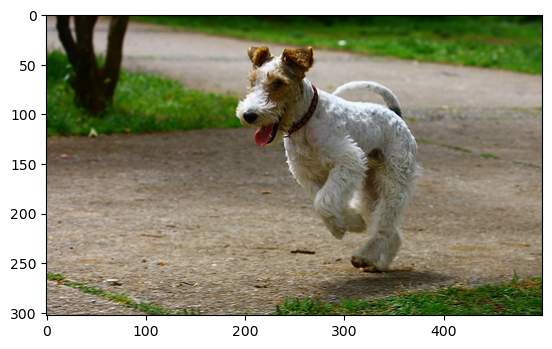

A group of people are ice skating in a big city .
Мера близости: 0.3968


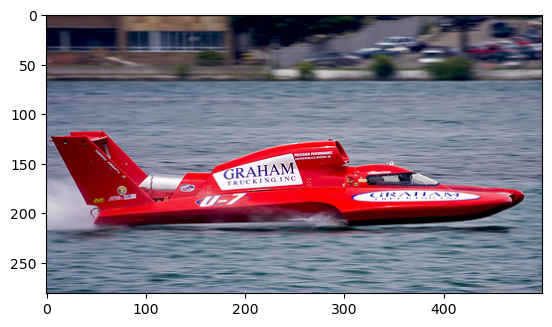

Little kid in blue coat and hat riding a tricycle .
This image is unavailable in your country in compliance with local laws.

Two black dogs fighting over an orange toy .
Мера близости: 0.3794


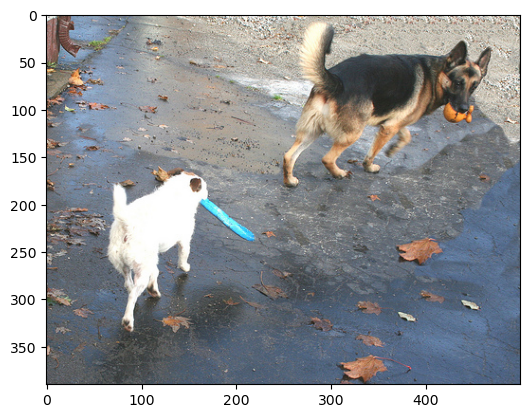

A dog jumping for a tennis ball near an ocean
Мера близости: 0.3899


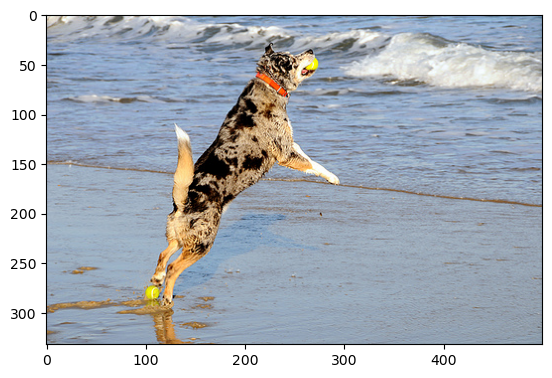

Boy flying a distant kite .
This image is unavailable in your country in compliance with local laws.

kids play ultimate Frisbee .
This image is unavailable in your country in compliance with local laws.

A girl in a purple shirt feeding ducks
This image is unavailable in your country in compliance with local laws.

There is a little blond hair girl with a green sweatshirt and a red shirt playing on a playground .
This image is unavailable in your country in compliance with local laws.

The brown German shepherd dog is playing with a stick .
Мера близости: 0.4273


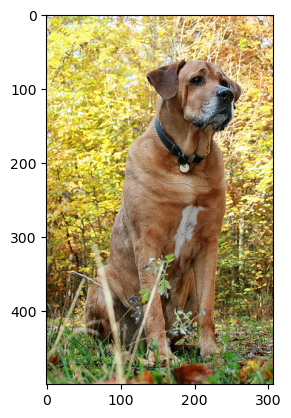

a little girl blows out her candles .
This image is unavailable in your country in compliance with local laws.

The little boy is smiling as he crosses a rope on an assault course .
This image is unavailable in your country in compliance with local laws.

A little white dog in running on the sidewalk .
Мера близости: 0.4441


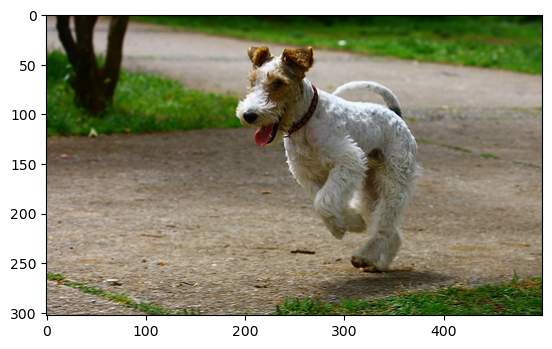

two people sit on a park bench .
Мера близости: 0.2918


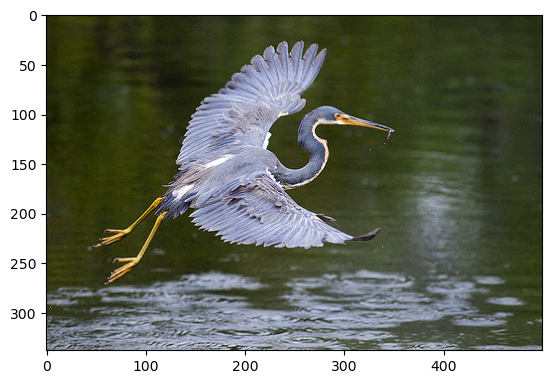

A black dog has a dumbbell in his mouth .
Мера близости: 0.3882


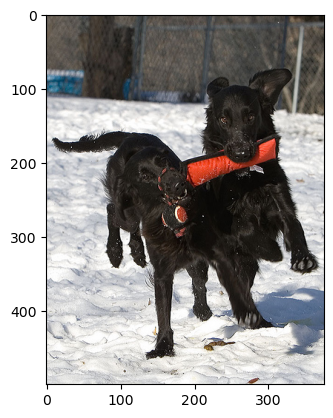

A boy holds a red bucket up to a pony .
This image is unavailable in your country in compliance with local laws.

A group of people perform together onstage .
Мера близости: 0.2969


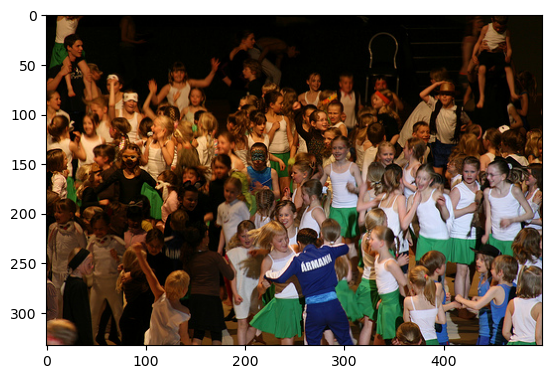

The girl is blowing out the candles on the chocolate cake .
This image is unavailable in your country in compliance with local laws.



In [70]:
for _, data in preview_df.iterrows():
    find_image(data)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Хороший  результат! Справились без нейронок. Самое удивительное что обучить нейронку, чтобы она заработала еще  нужно постараться, а тут кэтбуст "из коробки" показал  такой результат. 
    
    
    

    
</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
Небольшая формальность - пожалуйста добавь в код функции инфереса, чтобы она кроме изображения и текста  выводила найденную меру близости.</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментарий студента</b></font>
   
вывел

</div>

**Резюме**<br/>
Ограничение доступа к детскому контенту работает.<br/>
Модель адекватно предсказала 7 изображений из 9.<br/>
Это хороший результат.

<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Идеи и альтернативные подходы</b>
  Если хочешь получить хорошо работающее решение без обучения, то можешь провести эксперимент с нейронной сетью CLIP от OPEN AI (это не обязательно, только если хочешь добиться хороших результатов в этом проекте).

  Про эту нейронку много где написано, но можешь посмотреть например вот здесь  https://habr.com/ru/post/539312/.

  А для написания  реализации наиболее удобной лично для меня оказалась библиотека sbert. https://www.sbert.net/examples/applications/image-search/README.html  
    
    
<hr>    
    
Также неплохо работает следующий подход без предобученных моделей (к тому же легко реализуемый).
    
    
Вместо того, чтобы подавать на вход модели изображение + текст и получать меру соответствия, поступаем по другому. 
    
На вход модели подаем вектор описания, а на выходе учимся предсказывать вектор изображения. 
    
По поводу метрик тут ситуация следующая. Точно работает следующий подход
    
  - берем метрику mse, но тогда нужно чтобы модель её уменьшала. А значит в обучении используем только пары заведомо сответствующие друг другу

Можно попробовать использовать косинусное расстояние, она позволяет использовать все данные (если есть соответствие то выдает 1, если нет то 0). 
    
Также можно попробовать усложнить модель, например и изображения и тексты отправлять в пространство размерностью 256 и уже в этом пространстве учиться их "сближать".
    
По поводу методов векторизации: я бы использовать resnet18 для изображений (размерность эмбеддинга избражения 512) и БЕРТ для текстов (768). 
    
   
</div>

## 8. Выводы
В данном проекте я провел первичный анализ данных, проверил на пропуски и дубликаты. Ничего подозрительного обнаружено не было.<br/>
Оценки экспертов есть у каждой записи тренировочного датасета.<br/>
У 55 записей нет краудсорсинговой оценки, не смотря на то что общее количетсво краудсорсинговых оценок на порядок больше экспертных.<br/>
Для обучения моделей я вычислил итоговую оценку соответствия картинки и текста путем голосования большинства экспертов (2 из 3).<br/>
Там где выбрать оценку путем голосования не удалось - я подключил к голосованию краудсорсинговую оценку: она усиливала голос того эксперта, к которому была ближе.<br/><br/>

Я установил, что идентификатор комментария соответствует идентификатору изображения.<br/>
Это помогло мне установить ограничение на использование контента с детьми.<br/>
Чтобы найти запрещенные слова - мне пришлось лемматизировать текст.<br/>
В итоге удалилось 1696 изображений из тренировочного датасета. Это почти 30% обучающей выборки.<br/><br/>

Затем я применил модель resnet18 для векторизации изображения и модель Bert для векторизации текстов.<br/>
Оба вектора объединил в один.

Я разбил выборку на обучающую и валидационную.<br/>
Т.к. данные были получены разными моделями - сделал масштабирование признаков.<br/>
Провел обучение с помощью моделей линейной регрессии и catboost.<br/>
При этом линейная регрессия очень сильно переобучилось. А catboost выдал приемлемый результат: 0.26

Во время тестирования модель адекватно предсказала 7 изображений из 9.<br/>
Это хороший результат.<br/>
Считаю, что проект завершен успешно.


- Jupyter Notebook открыт
- Весь код выполняется без ошибок
- Ячейки с кодом расположены в порядке исполнения
- Исследовательский анализ данных выполнен
- Проверены экспертные оценки и краудсорсинговые оценки
- Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- Изображения векторизованы
- Текстовые запросы векторизованы
- Данные корректно разбиты на тренировочную и тестовую выборки
- Предложена метрика качества работы модели
- Предложена модель схожести изображений и текстового запроса
- Модель обучена
- По итогам обучения модели сделаны выводы
- Проведено тестирование работы модели
- По итогам тестирования визуально сравнили качество поиска

<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Заключительный комментарий</b>

Очень интересная и сильная работа. Проработаны все детали, все структурировано. При этом виден баланс: все сделано как надо, но просто, без лишнего усложнения.
 
Как итог - POC, который можно показать заказчику.
    
Если будет время можно "допилить" нейронку, но и с кэтбустом уже можно работать )).
    
Красный комментарий один, чисто формальный, уверен что ты легко допишешь пару строк кода.
    
Жду твою работу на повторное ревью.
</div>